In [13]:
import Pkg
Pkg.activate(@__DIR__)

  Activating project at `c:\Users\goninarn\Desktop\Stage\AR`


In [14]:
##Folder to print results
folder_results = "Results_DRIAS/Nantes4TN_TG"
folder_station = "../DRIAS"
##Station
file = folder_station * "/" * "T_Nantes4.txt"

##AR model
p = 3
method_ = "monthly"
periodicity_model = "trigo"       # "trigo", "smooth", "autotrigo", "stepwise_trigo"
degree_period = 2                     # 0 => default value -> "trigo" : 5, "smooth" : 9, "autotrigo" : 50, "stepwise_trigo" : 50
Trendtype = "LOESS"                   # "LOESS", "polynomial", "null" (for no additive trend)
trendparam = nothing                  # nothing => default value -> "LOESS" : 0.08, "polynomial" : 1
σ_periodicity_model = "trigo"     # "trigo", "smooth", "autotrigo", "stepwise_trigo", "null" (for no multiplicative periodicity)
σ_degree_period = 2                   # 0 => default value -> "trigo" : 5, "smooth" : 9, "autotrigo" : 50, "stepwise_trigo" : 50
σ_Trendtype = "LOESS"                 # "LOESS", "polynomial", "null" (for no multiplicative trend)
σ_trendparam = nothing                # nothing => default value -> "LOESS" : 0.08, "polynomial" : 1

##Simulations
n = 1000

1000

In [15]:
include("table_reader.jl")
include("utils/Missing_values.jl")
include("utils/Structure.jl")
include("utils/Plotting.jl")
cd(@__DIR__)

In [16]:
settings = OrderedDict((("file", file),
    ("p", p),
    ("method_", method_),
    ("periodicity_model", periodicity_model),
    ("degree_period", degree_period),
    ("Trendtype", Trendtype),
    ("trendparam", trendparam),
    ("σ_periodicity_model", σ_periodicity_model),
    ("σ_degree_period", σ_degree_period),
    ("σ_Trendtype", σ_Trendtype),
    ("σ_trendparam", σ_trendparam),
    ("n", n)))

OrderedDict{String, Any} with 12 entries:
  "file"                => "../DRIAS/T_Nantes4.txt"
  "p"                   => 3
  "method_"             => "monthly"
  "periodicity_model"   => "trigo"
  "degree_period"       => 2
  "Trendtype"           => "LOESS"
  "trendparam"          => nothing
  "σ_periodicity_model" => "trigo"
  "σ_degree_period"     => 2
  "σ_Trendtype"         => "LOESS"
  "σ_trendparam"        => nothing
  "n"                   => 1000

In [17]:
df = extract_series_DRIAS(file)
date_vec, x = df.DATE,Matrix(df[:,Cols("TN",last(folder_results,2))])

Caracteristics_Series_vec = init_CaracteristicsSeries.([df[:,Cols("DATE","TN")],df[:,Cols("DATE",last(folder_results,2))]])

2-element Vector{CaracteristicsSeries}:
 CaracteristicsSeries([4.754315789473684, 4.7677894736842115, 4.668631578947369, 4.811578947368421, 4.701999999999999, 4.270947368421052, 3.7434736842105263, 4.148421052631579, 4.600421052631579, 4.485894736842105  …  4.770000000000002, 4.736631578947368, 4.903684210526316, 5.353894736842105, 5.544526315789474, 5.136947368421052, 5.175578947368421, 5.1693684210526305, 4.946, 4.873368421052632], [13.44, 13.09, 12.93, 11.4, 11.97, 13.15, 11.95, 12.23, 12.26, 12.42  …  12.8, 13.16, 13.07, 13.27, 12.97, 13.64, 11.85, 12.73, 12.03, 13.58], 12×4 DataFrame
 Row │ MONTH  MONTHLY_MEAN  MONTHLY_STD  MONTHLY_MAX 
     │ Int64  Float64       Float64      Float64     
─────┼───────────────────────────────────────────────
   1 │     1       4.0805       4.0648         13.56
   2 │     2       3.77738      3.89261        13.68
   3 │     3       6.43384      3.66843        16.04
   4 │     4       8.17401      3.39017        20.26
   5 │     5      11.5357     

In [18]:
# Model = fit_Multi_AR(x, date_vec,
#     p=p,
#     method_=method_,
#     periodicity_model=periodicity_model,
#     degree_period=degree_period,
#     Trendtype=Trendtype,
#     trendparam=trendparam,
#     σ_periodicity_model=σ_periodicity_model,
#     σ_degree_period=σ_degree_period,
#     σ_Trendtype=σ_Trendtype,
#     σ_trendparam=σ_trendparam)

In [19]:

# save_model(Model, folder_results * "/model" * folder_results[15:end] * "_p$(p)_k$(degree_period)" * ".jld2")

Model = load_model(folder_results * "/model" * folder_results[15:end] * "_p$(p)_k$(degree_period)" * ".jld2")

Multi_MonthlyAR([[[0.23284537310545558 0.8037662960819247; 0.01472466773827764 0.9812875570462057], [-0.13984306960732007 -0.2348794036065215; -0.19033951583919495 -0.1278212689944344], [0.013724677660640176 0.10036816371947899; 0.0001321519323373242 0.110294642456353]], [[0.25161095863616656 0.8197151042416431; -0.048184669729299294 1.0615947744657968], [-0.11281437532208169 -0.19771201409392677; -0.15481140191412246 -0.11010887324475548], [0.03462901678819962 0.006544428345479888; 0.00303369732913822 0.0551251865353372]], [[0.26754824025538704 0.8111933812772946; -0.1286319302172029 1.1060241783611182], [-0.03386080597350858 -0.33813474554768547; -0.03748051101424731 -0.26405768082988096], [0.027662900559038067 0.0521422540627371; -0.014514295468994524 0.10234585569720449]], [[0.36338905391782145 0.6668100834037765; -0.09499172790923005 1.0044750894494279], [-0.0688131446520863 -0.21968799520934007; -0.12171363513916121 -0.08815146766378146], [0.055637351783679706 -0.0042878125401728

In [20]:
sample_ = rand(Model, n)

1000-element Vector{Matrix{Float64}}:
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 8.69354190491498 11.630842165146316; 10.774991958566254 12.99676273026451]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 0.7868875634331154 2.8149277373973716; -0.20564901375695221 2.466027565206266]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 0.9662814857557107 2.7313054724138217; 2.3294273482613086 4.320220519356729]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 5.206029983358683 8.42487237265441; 5.767276348068686 9.362604380561416]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 4.803805496801462 7.011459111782987; 5.660135100564343 8.668848035092816]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 8.622040381735244 10.04702760208132; 6.794363692091341 8.403720991533218]
 [-1.6999999999999993 3.9299999999999997; 1.9900000000000002 5.85; … ; 2.16232938358

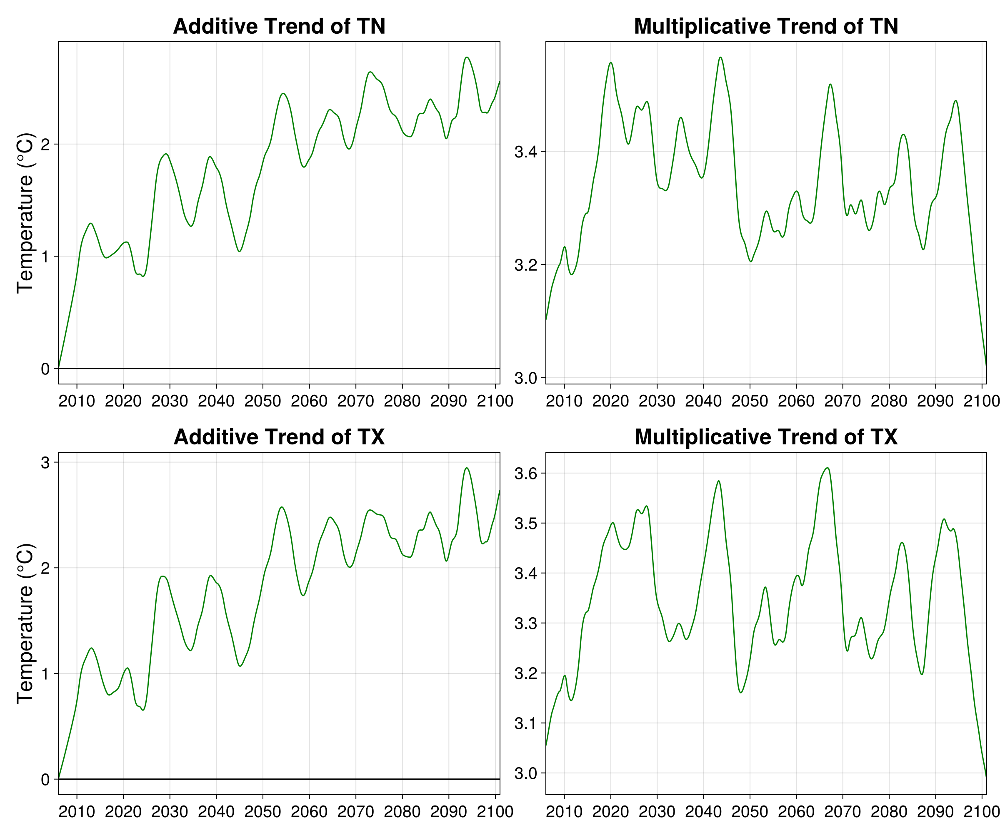

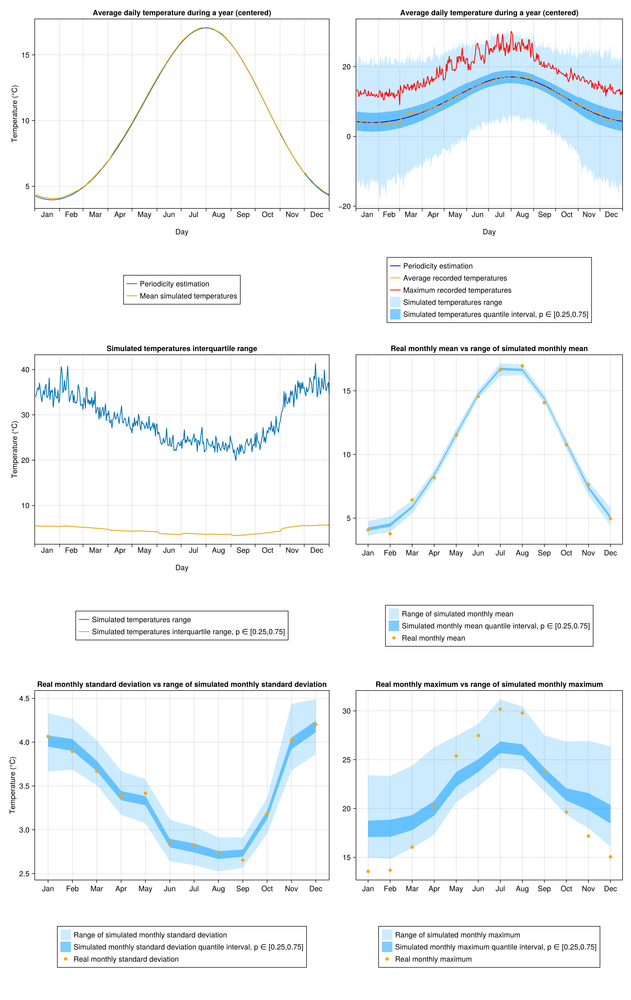

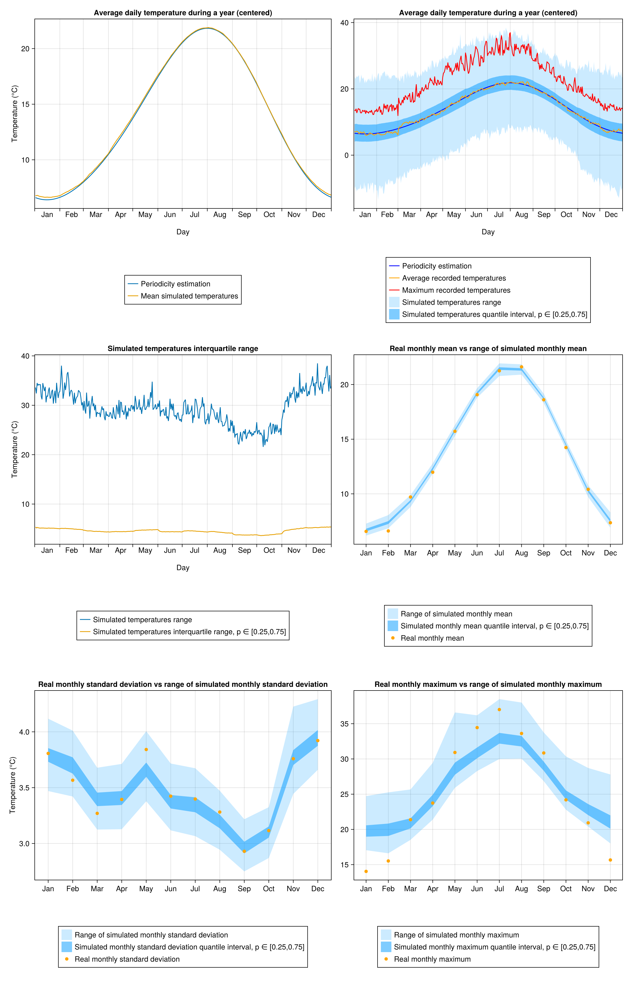

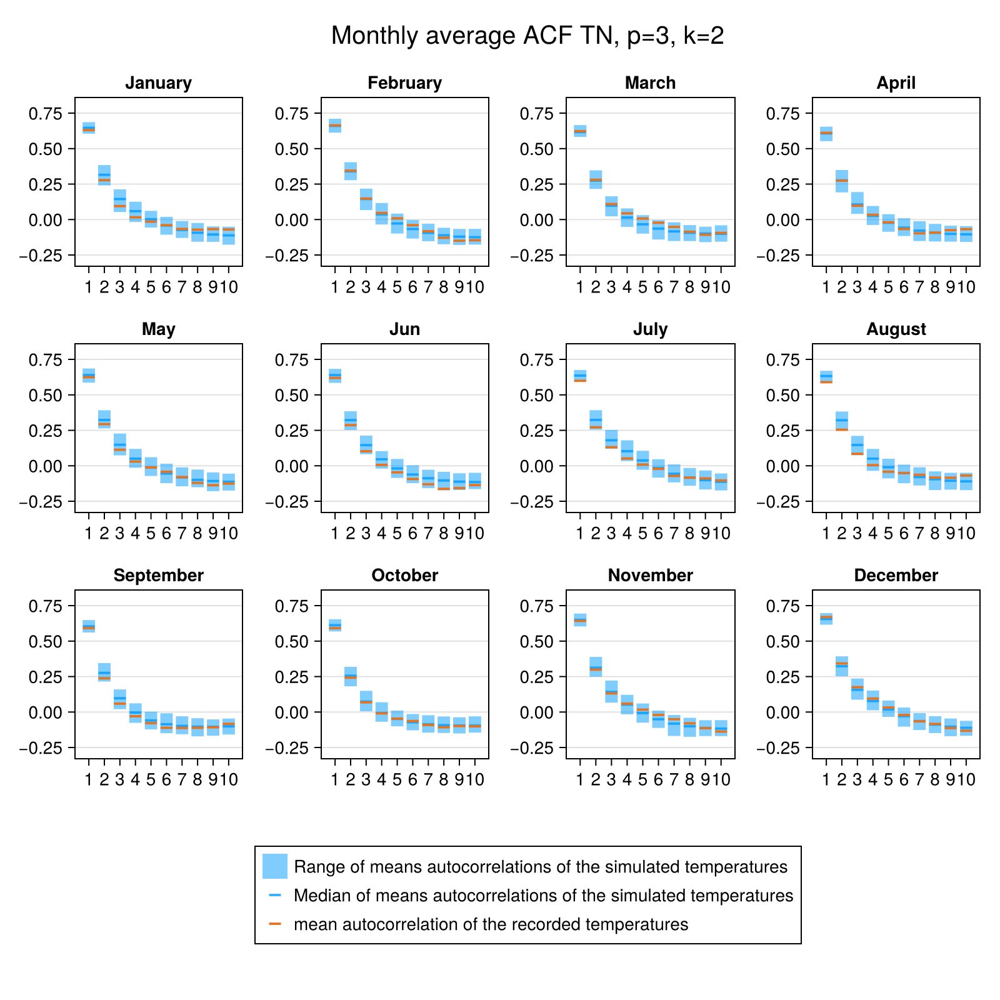

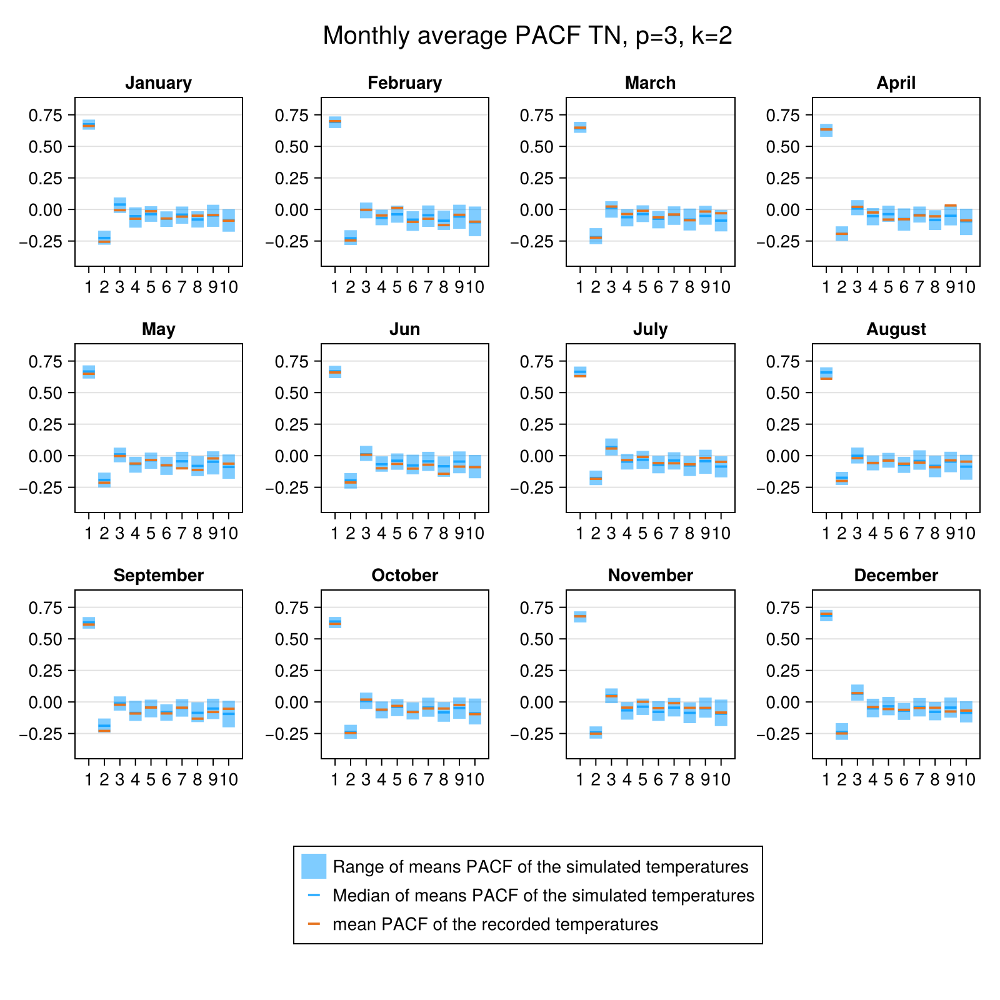

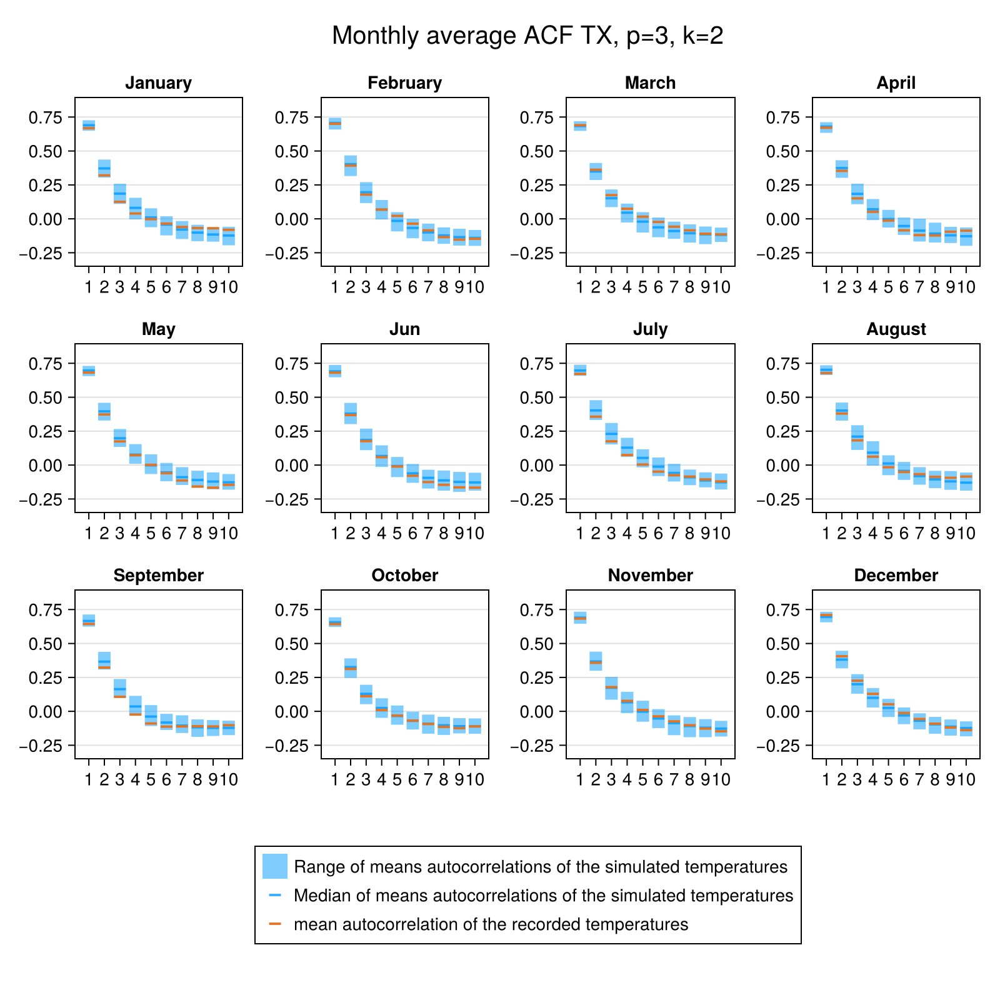

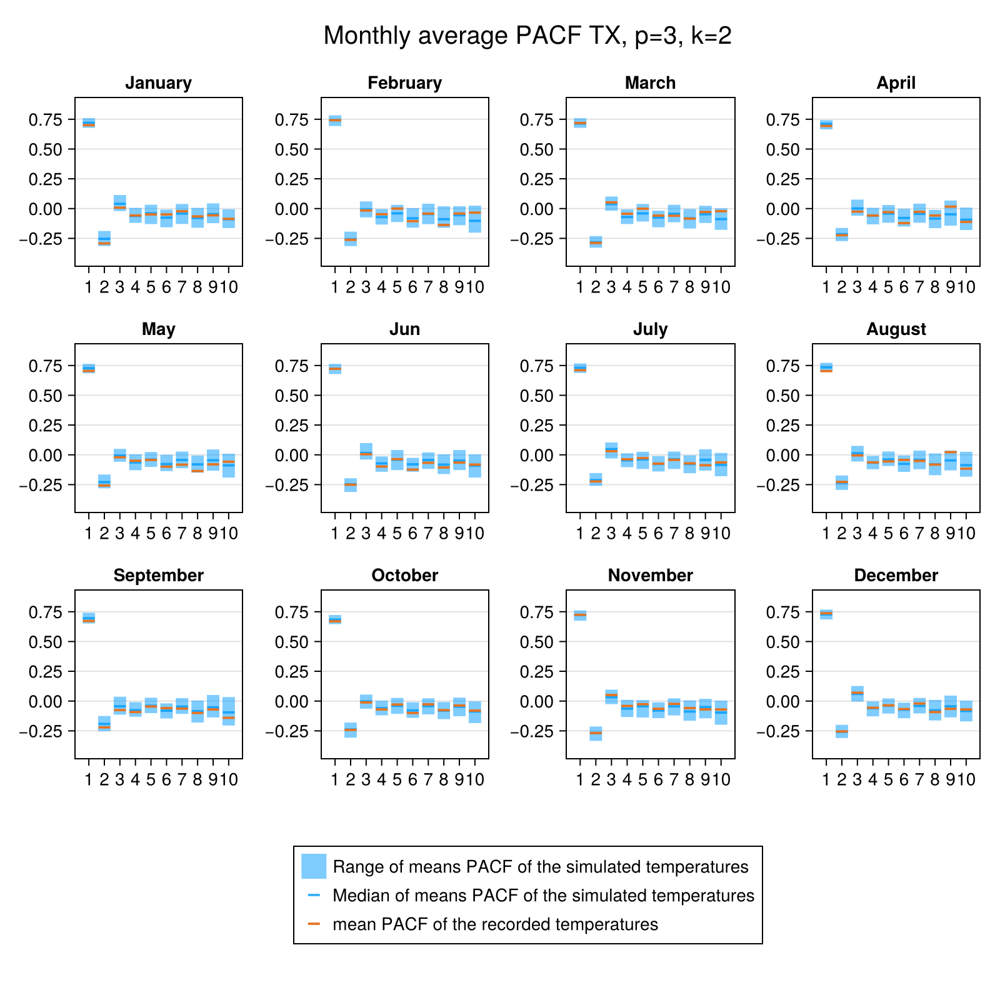

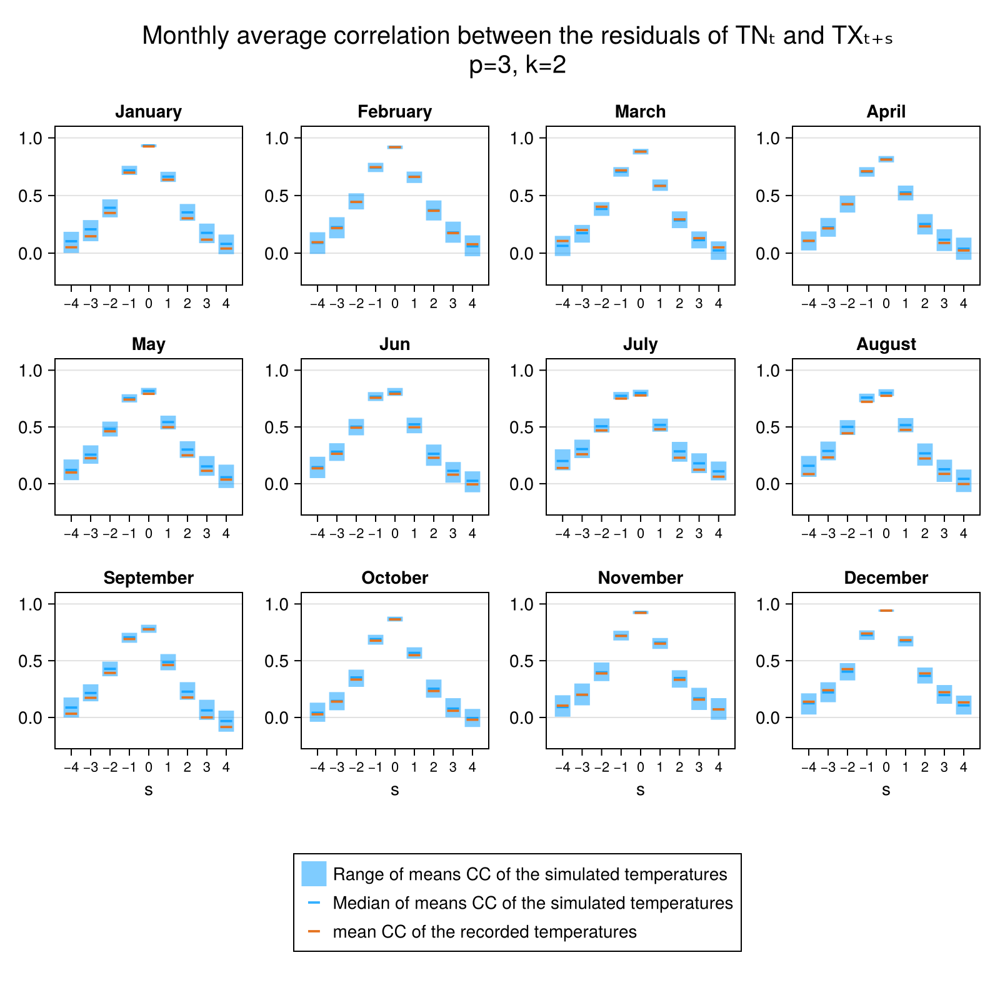

Number of scenarios with dates where TN > TX 0
Percentage of scenarios with dates where TN > TX 0.0 %
Mean percentage of dates where TN > TX : 0.0 %
Median percentage of dates where TN > TX : 0.0 %


In [21]:
include("utils/Plotting.jl")
fig_tuple = Sample_diagnostic(sample_, Caracteristics_Series_vec, Model, folder=folder_results, settings=settings, TG_bool=false)
display.(fig_tuple)
println("Number of scenarios with dates where TN > TX $(sum(TN_Grt_TX.(sample_) .> 0))")
println("Percentage of scenarios with dates where TN > TX $(trunc(100*sum(TN_Grt_TX.(sample_) .> 0)/length(sample_),digits=2)) %")
println("Mean percentage of dates where TN > TX : $(trunc(100*mean(TN_Grt_TX.(sample_))/length(Model.date_vec),digits=2)) %")
println("Median percentage of dates where TN > TX : $(trunc(100*median(TN_Grt_TX.(sample_))/length(Model.date_vec),digits=2)) %")

Pour le premiers graphes (en haut à gauche) différences expliquées par les corrections

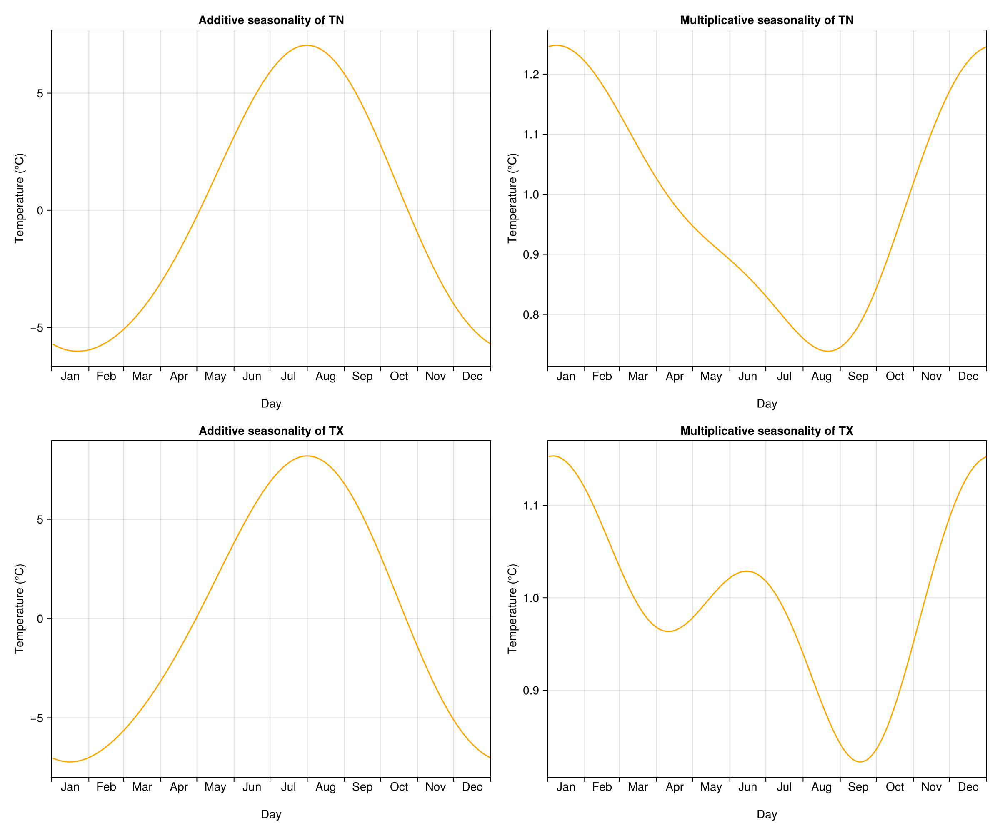

In [22]:
PlotSeasonnality(Model)

In [23]:
import Pkg
Pkg.status()

Status `C:\Users\goninarn\Desktop\Stage\AR\Project.toml`
  [336ed68f] CSV v0.10.15
⌃ [13f3f980] CairoMakie v0.13.10
  [2569d6c7] ConcreteStructs v0.2.3
  [a93c6f00] DataFrames v1.7.0
  [1313f7d8] DataFramesMeta v0.15.4
⌃ [82cc6244] DataInterpolations v8.2.0
  [31c24e10] Distributions v0.25.120
  [5789e2e9] FileIO v1.17.0
⌅ [f6369f11] ForwardDiff v0.10.38
  [38e38edf] GLM v1.9.0
⌃ [033835bb] JLD2 v0.5.15
  [4345ca2d] Loess v0.6.4 `https://github.com/JuliaStats/Loess.jl#master`
⌃ [7f7a1694] Optimization v4.2.0
  [36348300] OptimizationOptimJL v0.4.3
  [bac558e1] OrderedCollections v1.8.1
⌃ [f27b6e38] Polynomials v4.0.21
  [29dad682] RegularizationTools v0.6.0
⌃ [3d8e1505] SmoothPeriodicStatsModels v2.0.2-DEV
⌃ [2913bbd2] StatsBase v0.34.5
  [f3b207a7] StatsPlots v0.15.7
⌃ [3eadb0b9] StochasticWeatherGenerators v1.2.3-DEV
  [ade2ca70] Dates v1.11.0
  [f43a241f] Downloads v1.6.0
Info Packages marked with ⌃ and ⌅ have new versions available. Those with ⌃ may be upgradable, but those with ⌅ 

In [24]:
import Pkg
Pkg.status()

Status `C:\Users\goninarn\Desktop\Stage\AR\Project.toml`
  [336ed68f] CSV v0.10.15
⌃ [13f3f980] CairoMakie v0.13.10
  [2569d6c7] ConcreteStructs v0.2.3
  [a93c6f00] DataFrames v1.7.0
  [1313f7d8] DataFramesMeta v0.15.4
⌃ [82cc6244] DataInterpolations v8.2.0
  [31c24e10] Distributions v0.25.120
  [5789e2e9] FileIO v1.17.0
⌅ [f6369f11] ForwardDiff v0.10.38
  [38e38edf] GLM v1.9.0
⌃ [033835bb] JLD2 v0.5.15
  [4345ca2d] Loess v0.6.4 `https://github.com/JuliaStats/Loess.jl#master`
⌃ [7f7a1694] Optimization v4.2.0
  [36348300] OptimizationOptimJL v0.4.3
  [bac558e1] OrderedCollections v1.8.1
⌃ [f27b6e38] Polynomials v4.0.21
  [29dad682] RegularizationTools v0.6.0
⌃ [3d8e1505] SmoothPeriodicStatsModels v2.0.2-DEV
⌃ [2913bbd2] StatsBase v0.34.5
  [f3b207a7] StatsPlots v0.15.7
⌃ [3eadb0b9] StochasticWeatherGenerators v1.2.3-DEV
  [ade2ca70] Dates v1.11.0
  [f43a241f] Downloads v1.6.0
Info Packages marked with ⌃ and ⌅ have new versions available. Those with ⌃ may be upgradable, but those with ⌅ 